In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Flatten, LSTM, GlobalMaxPooling1D, Embedding, Input, Dense, Activation, Dropout
from tensorflow.keras.models import Sequential, Model
from sklearn.model_selection import train_test_split
from keras.optimizers import SGD,Adam, RMSprop,Nadam
import tensorflow as tf
import pandas as pd
import numpy as np
import re
from tensorflow import keras

import matplotlib.pyplot as plt

In [ ]:
messages = pd.read_csv('/content/drive/MyDrive/datasets/combined2csv_final_121620.csv')

In [ ]:
messages.head()

,ID,Text,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,scheduling,health_education,problems_solved,grateful_patient,service_complaint,emergent,urgent,non-urgent,fever,covid19,social_stigma,depression,maternal_child_health,gender_equity_feminism
0,7222,(P): OK || (C): Good morning! This is the rese...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,5140,(P): **** || (C): Bad enough you need to see ...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,7497,(P): Hi **** . Please tell me how to unsubscr...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,6638,(P): I'm doing great,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,5577,(P): Yes thinks are ok || (P): *things,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
messages.shape

(3373, 40)

In [ ]:
#Checking null or empty strings
filter = messages["Text"]!= ""
messages = messages[filter]

In [ ]:
messages.shape

(3373, 40)

In [ ]:
# dropping them if there is any
messages = messages.dropna()

In [ ]:
messages.shape

(3373, 40)

In [ ]:
messages["Text"][172]

'(P): That would be good about a brace || (P): Today I rehurt  my knee for the third time the pain is unbareable'

In [ ]:
# lets plot the comments count for each label.
messages.columns

Index(['ID', 'Text', 'physical', 'emotional', 'diagnosis', 'laboratory',
       'imaging', 'medications', 'procedures', 'alternative', 'therapy',
       'counseling', 'diet', 'exercise', 'substance', 'housing', 'work',
       'social_service', 'ff', 'cultural', 'travel', 'environment',
       'financial', 'outpatient', 'hospitalization', 'technical', 'scheduling',
       'health_education', 'problems_solved', 'grateful_patient',
       'service_complaint', 'emergent', 'urgent', 'non-urgent', 'fever',
       'covid19', 'social_stigma', 'depression', 'maternal_child_health',
       'gender_equity_feminism'],
      dtype='object')

In [ ]:
messages_labels = messages[['physical', 'emotional', 'diagnosis', 'laboratory',
       'imaging', 'medications', 'procedures', 'alternative', 'therapy',
       'counseling', 'diet', 'exercise', 'substance', 'housing', 'work',
       'social_service', 'ff', 'cultural', 'travel', 'environment',
       'financial', 'outpatient', 'hospitalization', 'technical', 'scheduling',
       'health_education', 'problems_solved', 'grateful_patient',
       'service_complaint', 'emergent', 'urgent', 'non-urgent', 'fever',
       'covid19', 'social_stigma', 'depression', 'maternal_child_health',
       'gender_equity_feminism']]

messages_labels.head()

,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,scheduling,health_education,problems_solved,grateful_patient,service_complaint,emergent,urgent,non-urgent,fever,covid19,social_stigma,depression,maternal_child_health,gender_equity_feminism
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


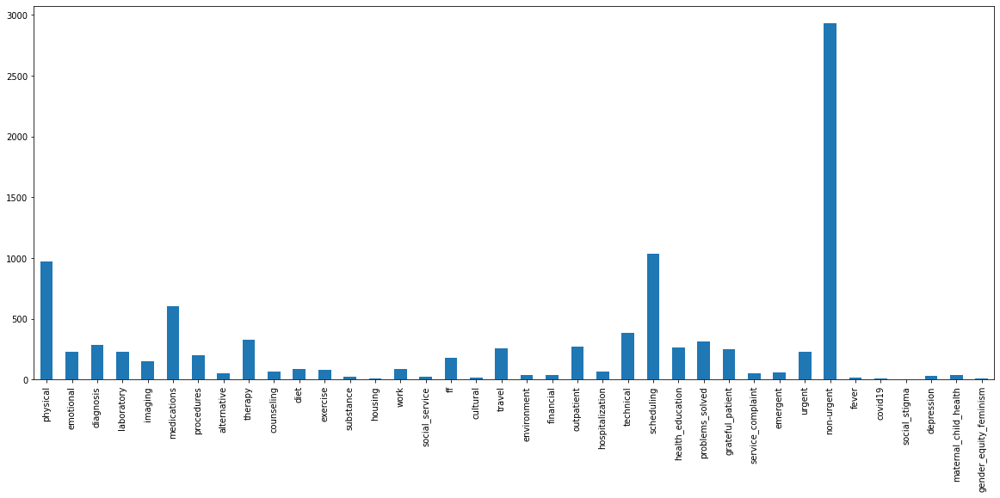

In [ ]:
# count for each labels
f, ax = plt.subplots(figsize=(20,8))
messages_labels.sum().plot.bar()

# Multi-Label Classification Problem with Single Output Layer

In [ ]:
# cleaning the text
import nltk
import re
nltk.download('stopwords')      #downloading stopwords
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
def text_stemming(text):
  msg = re.sub('[^a-zA-Z]', ' ', text)
  msg = msg.lower()
  msg = nltk.tokenize.word_tokenize(msg)
  # ps = PorterStemmer()
  # wl = WordNetLemmatizer()
  # print('After tokenization')
  # print(msg)
  # msg = [ps.stem(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [wl.lemmatize(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [ps.stem(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [ps.stem(word) for word in msg if not word in my_stopwords]
  # print('After stemming and removing stop words')
  # print(msg)
  msg = [word for word in msg if len(word)>2]
  # print('After keeping only words whose length is greater than 2')
  # print(msg)
  msg = ' '.join(msg)
  return msg

In [ ]:
messages['Processed_text'] =messages.Text.apply(lambda x: text_stemming(x))

In [ ]:
messages.head()

,ID,Text,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,scheduling,health_education,problems_solved,grateful_patient,service_complaint,emergent,urgent,non-urgent,fever,covid19,social_stigma,depression,maternal_child_health,gender_equity_feminism,Processed_text
0,7222,(P): OK || (C): Good morning! This is the rese...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,good morning this the researcher the clinic yo...
1,5140,(P): **** || (C): Bad enough you need to see ...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,bad enough you need see doctor bad enough you ...
2,7497,(P): Hi **** . Please tell me how to unsubscr...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,please tell how unsubscribe from this check th...
3,6638,(P): I'm doing great,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,doing great
4,5577,(P): Yes thinks are ok || (P): *things,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,yes thinks are things


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(messages["Processed_text"], messages_labels, test_size =0.4 , random_state=0)

In [ ]:
# Checking percentage of samples for each labels
label_percent = (messages_labels.mean()*100).sort_values(ascending=False)
label_percent

non-urgent                86.836644
scheduling                30.655203
physical                  28.817077
medications               17.906908
technical                 11.473466
therapy                    9.664987
problems_solved            9.279573
diagnosis                  8.568040
outpatient                 8.004744
health_education           7.886155
travel                     7.708272
grateful_patient           7.322858
laboratory                 6.789208
emotional                  6.759561
urgent                     6.700267
procedures                 6.018381
ff                         5.336496
imaging                    4.387785
work                       2.549659
diet                       2.520012
exercise                   2.431070
counseling                 1.956715
hospitalization            1.897421
emergent                   1.867773
service_complaint          1.571302
alternative                1.541654
environment                1.126594
maternal_child_health      1

In [ ]:
# Picking only those samples whichh have count greater than 6% of overall sample
label_percent[label_percent > 10]

non-urgent     86.836644
scheduling     30.655203
physical       28.817077
medications    17.906908
technical      11.473466
dtype: float64

In [ ]:
# creating training and testing variables
y1_train = y_train[["non-urgent"]].values
y1_test =  y_test[["non-urgent"]].values

y2_train = y_train[["scheduling"]].values
y2_test =  y_test[["scheduling"]].values

y3_train = y_train[["physical"]].values
y3_test =  y_test[["physical"]].values

y4_train = y_train[["medications"]].values
y4_test =  y_test[["medications"]].values

y5_train = y_train[["technical"]].values
y5_test =  y_test[["technical"]].values

In [ ]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train) # getting the index for each word word['cat'] =2, fitting the training data

X_train = tokenizer.texts_to_sequences(X_train) # transforming the text into integer using above dictionary
X_test = tokenizer.texts_to_sequences(X_test)

vocab_size = len(tokenizer.word_index) + 1
maxlen = 200

In [ ]:
X_train = pad_sequences(X_train,maxlen=maxlen)
X_test = pad_sequences(X_test,maxlen=maxlen)

# Glove Word Embedding


https://www.kaggle.com/danielwillgeorge/glove6b100dtxt

In [ ]:
from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()

glove_file = open('/content/drive/MyDrive/datasets/glove.6B.100d.txt')

for line in glove_file:
  records = line.split()
  word = records[0]
  vector_dimensions = asarray(records[1:], dtype='float32')
  embeddings_dictionary[word] = vector_dimensions

glove_file.close()

embedding_matrix = zeros((vocab_size, 100))
for word, index in tokenizer.word_index.items():
  embedding_vector = embeddings_dictionary.get(word)
  if embedding_vector is not None:
    embedding_matrix[index] = embedding_vector

# Building a Model

In [ ]:
maxlen

200

In [ ]:
vocab_size

5655

In [ ]:
pip install talos

     |████████████████████████████████| 61kB 3.5MB/s 
     |████████████████████████████████| 9.5MB 9.0MB/s 
     |████████████████████████████████| 5.4MB 35.7MB/s 
     |████████████████████████████████| 26.6MB 124kB/s 
     |████████████████████████████████| 2.6MB 56.7MB/s 
  Created wheel for kerasplotlib: filename=kerasplotlib-0.1.6-cp37-none-any.whl size=3603 sha256=660d8cacbdc19b2f7427789c5b81a22364a1d40dad0827849a36ed634152a81e
  Stored in directory: /root/.cache/pip/wheels/9d/d3/8c/9503a22b0a38e8b21c70ad834e4606d209193443e5c709305d
  Created wheel for wrangle: filename=wrangle-0.6.7-cp37-none-any.whl size=49894 sha256=85f3ced72fa96e55fd36a1ae823868e2519e4bae341f8c98b2fe299aa2b20396
  Stored in directory: /root/.cache/pip/wheels/bf/1b/50/d0403ce6ef269e364894da7b50db68db14c4ac62c577561e2d
  Created wheel for chances: filename=chances-0.1.9-cp37-none-any.whl size=41610 sha256=f286868c59c33b3a02aec5738195e75a8df3ddd3b2632a4d4eebe5b353a3e9c8
  Stored in directory: /root/.cache/pip/w

In [ ]:
import talos

In [ ]:
#Adding Input Parameters to the Function.
def topics_classifier(x_train,y_train,x_val, y_val,params):
  
  #inp=Input(shape=(maxpadlen, ),dtype='int32')
  #print(maxlen)
  inp = Input(shape=(200,))

  embedding_layer =  Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)
  embedded_sequences = embedding_layer(inp)

  x = LSTM(params['output_count_lstm'],name='lstm_layer')(embedded_sequences)
  
  x = Dropout(params['dropout'])(x)
  
  x = Dense(params['output_count_dense'], activation=params['activation'])(x)
  
  x = Dropout(params['dropout'])(x)
  
  output_1 = Dense(1, activation=params['last_activation'])(x)
  output_2 = Dense(1, activation=params['last_activation'])(x)
  output_3 = Dense(1, activation=params['last_activation'])(x)
  output_4 = Dense(1, activation=params['last_activation'])(x)
  output_5 = Dense(1, activation=params['last_activation'])(x)

  model = Model(inputs=inp, outputs=[output_1,output_2,output_3,output_4,output_5])

  model.compile(loss=params['loss'], optimizer=params['optimizer'], metrics=['accuracy'])

  model_info=model.fit(x= x_train,y= y_train,
                       epochs=params['epochs'], batch_size=params['batch_size'],  validation_data=(x_val, y_val))

  return model_info, model

In [ ]:
#Creating a dictionary of Parameters.
p={
    'output_count_lstm': [64, 128],
    'output_count_dense': [40, 50],
    'batch_size': [128],
    'epochs':[500],
    'optimizer':['Nadam','adam'],
    'activation':['relu'],
    'last_activation': ['sigmoid'],
    'dropout':[0.1,0.2],
    'loss': ['binary_crossentropy']   
}

#Initiating GridSearchCV.
scan_results = talos.Scan(x=X_train,
           y = [y1_train, y2_train, y3_train,y4_train,y5_train],
           x_val = X_test,
           y_val = [y1_test, y2_test, y3_test,y4_test,y5_test],
           params=p,
           model=topics_classifier,
           experiment_name='topic_cls',
           print_params=True)

  0%|          | 0/16 [00:00<?, ?it/s]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 33s 88ms/step - loss: 3.2000 - dense_1_loss: 0.6441 - dense_2_loss: 0.6889 - dense_3_loss: 0.6646 - dense_4_loss: 0.5962 - dense_5_loss: 0.6062 - dense_1_accuracy: 0.6027 - dense_2_accuracy: 0.5458 - dense_3_accuracy: 0.6457 - dense_4_accuracy: 0.8080 - dense_5_accuracy: 0.7290 - val_loss: 2.5653 - val_dense_1_loss: 0.4092 - val_dense_2_loss: 0.6392 - val_dense_3_loss: 0.6085 - val_dense_4_loss: 0.5172 - val_dense_5_loss: 0.3912 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6881 - val_dense_3_accuracy: 0.7230 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8874
Epoch 2/500
16/16 [==============================] - 0s 27ms/step - loss: 2.5819 - dense_1_loss: 0.4228 - dense_2_loss: 0.6152 - dense_3_loss: 0.6186 - 

  6%|▋         | 1/16 [04:49<1:12:20, 289.39s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 4s 75ms/step - loss: 3.0339 - dense_1_loss: 0.5638 - dense_2_loss: 0.6605 - dense_3_loss: 0.6625 - dense_4_loss: 0.5857 - dense_5_loss: 0.5614 - dense_1_accuracy: 0.7081 - dense_2_accuracy: 0.6730 - dense_3_accuracy: 0.6425 - dense_4_accuracy: 0.8093 - dense_5_accuracy: 0.7111 - val_loss: 2.3712 - val_dense_1_loss: 0.3957 - val_dense_2_loss: 0.5666 - val_dense_3_loss: 0.5699 - val_dense_4_loss: 0.4912 - val_dense_5_loss: 0.3479 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.7074 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 34ms/step - loss: 2.3897 - dense_1_loss: 0.4467 - dense_2_loss: 0.5557 - dense_3_loss: 0.5774 - 

 12%|█▎        | 2/16 [09:49<1:08:14, 292.46s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 4s 73ms/step - loss: 2.9826 - dense_1_loss: 0.5089 - dense_2_loss: 0.6510 - dense_3_loss: 0.6541 - dense_4_loss: 0.6415 - dense_5_loss: 0.5272 - dense_1_accuracy: 0.8491 - dense_2_accuracy: 0.6844 - dense_3_accuracy: 0.6930 - dense_4_accuracy: 0.6638 - dense_5_accuracy: 0.8706 - val_loss: 2.5174 - val_dense_1_loss: 0.3945 - val_dense_2_loss: 0.6301 - val_dense_3_loss: 0.6014 - val_dense_4_loss: 0.5179 - val_dense_5_loss: 0.3736 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6733 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 0s 29ms/step - loss: 2.5127 - dense_1_loss: 0.4313 - dense_2_loss: 0.5892 - dense_3_loss: 0.6072 - d

 19%|█▉        | 3/16 [14:13<1:01:32, 284.02s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 4s 79ms/step - loss: 3.1050 - dense_1_loss: 0.5789 - dense_2_loss: 0.6714 - dense_3_loss: 0.6570 - dense_4_loss: 0.5535 - dense_5_loss: 0.6442 - dense_1_accuracy: 0.7247 - dense_2_accuracy: 0.6066 - dense_3_accuracy: 0.6797 - dense_4_accuracy: 0.8248 - dense_5_accuracy: 0.5720 - val_loss: 2.3964 - val_dense_1_loss: 0.3960 - val_dense_2_loss: 0.6061 - val_dense_3_loss: 0.5535 - val_dense_4_loss: 0.4734 - val_dense_5_loss: 0.3674 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.7067 - val_dense_3_accuracy: 0.7378 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8874
Epoch 2/500
16/16 [==============================] - 1s 36ms/step - loss: 2.4053 - dense_1_loss: 0.4090 - dense_2_loss: 0.5818 - dense_3_loss: 0.5728 - 

 25%|██▌       | 4/16 [19:18<58:02, 290.22s/it]  

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 3s 71ms/step - loss: 3.3842 - dense_1_loss: 0.6900 - dense_2_loss: 0.6889 - dense_3_loss: 0.7027 - dense_4_loss: 0.6587 - dense_5_loss: 0.6440 - dense_1_accuracy: 0.4651 - dense_2_accuracy: 0.5307 - dense_3_accuracy: 0.4742 - dense_4_accuracy: 0.6695 - dense_5_accuracy: 0.6657 - val_loss: 2.7680 - val_dense_1_loss: 0.4859 - val_dense_2_loss: 0.6498 - val_dense_3_loss: 0.6550 - val_dense_4_loss: 0.5609 - val_dense_5_loss: 0.4164 - val_dense_1_accuracy: 0.8741 - val_dense_2_accuracy: 0.6704 - val_dense_3_accuracy: 0.7230 - val_dense_4_accuracy: 0.8185 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 0s 29ms/step - loss: 2.6779 - dense_1_loss: 0.4670 - dense_2_loss: 0.6307 - dense_3_loss: 0.6491 - de

 31%|███▏      | 5/16 [23:35<51:25, 280.54s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 4s 77ms/step - loss: 3.0521 - dense_1_loss: 0.5154 - dense_2_loss: 0.6940 - dense_3_loss: 0.6602 - dense_4_loss: 0.5916 - dense_5_loss: 0.5910 - dense_1_accuracy: 0.8528 - dense_2_accuracy: 0.5220 - dense_3_accuracy: 0.6829 - dense_4_accuracy: 0.7590 - dense_5_accuracy: 0.6540 - val_loss: 2.4446 - val_dense_1_loss: 0.3886 - val_dense_2_loss: 0.6259 - val_dense_3_loss: 0.5834 - val_dense_4_loss: 0.4831 - val_dense_5_loss: 0.3636 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6904 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8170 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 35ms/step - loss: 2.4267 - dense_1_loss: 0.4047 - dense_2_loss: 0.6069 - dense_3_loss: 0.5892 - d

 38%|███▊      | 6/16 [28:22<47:02, 282.23s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 3s 70ms/step - loss: 3.1393 - dense_1_loss: 0.5705 - dense_2_loss: 0.6644 - dense_3_loss: 0.6667 - dense_4_loss: 0.6349 - dense_5_loss: 0.6029 - dense_1_accuracy: 0.8233 - dense_2_accuracy: 0.6515 - dense_3_accuracy: 0.6512 - dense_4_accuracy: 0.7324 - dense_5_accuracy: 0.6738 - val_loss: 2.5280 - val_dense_1_loss: 0.3950 - val_dense_2_loss: 0.6525 - val_dense_3_loss: 0.6009 - val_dense_4_loss: 0.5108 - val_dense_5_loss: 0.3687 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6733 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 0s 31ms/step - loss: 2.5114 - dense_1_loss: 0.4150 - dense_2_loss: 0.6181 - dense_3_loss: 0.5965 - de

 44%|████▍     | 7/16 [32:46<41:32, 276.99s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 3s 75ms/step - loss: 3.1216 - dense_1_loss: 0.5540 - dense_2_loss: 0.6651 - dense_3_loss: 0.6637 - dense_4_loss: 0.6567 - dense_5_loss: 0.5821 - dense_1_accuracy: 0.8232 - dense_2_accuracy: 0.6259 - dense_3_accuracy: 0.6646 - dense_4_accuracy: 0.6049 - dense_5_accuracy: 0.7387 - val_loss: 2.4339 - val_dense_1_loss: 0.3821 - val_dense_2_loss: 0.6199 - val_dense_3_loss: 0.5886 - val_dense_4_loss: 0.4973 - val_dense_5_loss: 0.3461 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6956 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 34ms/step - loss: 2.4939 - dense_1_loss: 0.4366 - dense_2_loss: 0.6017 - dense_3_loss: 0.6110 - d

 50%|█████     | 8/16 [37:37<37:28, 281.09s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 4s 74ms/step - loss: 3.2426 - dense_1_loss: 0.6232 - dense_2_loss: 0.6984 - dense_3_loss: 0.6839 - dense_4_loss: 0.6321 - dense_5_loss: 0.6051 - dense_1_accuracy: 0.7134 - dense_2_accuracy: 0.5194 - dense_3_accuracy: 0.5538 - dense_4_accuracy: 0.7219 - dense_5_accuracy: 0.6885 - val_loss: 2.5988 - val_dense_1_loss: 0.4377 - val_dense_2_loss: 0.6456 - val_dense_3_loss: 0.6131 - val_dense_4_loss: 0.5253 - val_dense_5_loss: 0.3771 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6711 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8889
Epoch 2/500
16/16 [==============================] - 1s 35ms/step - loss: 2.6025 - dense_1_loss: 0.4441 - dense_2_loss: 0.6211 - dense_3_loss: 0.6373 - d

 56%|█████▋    | 9/16 [42:23<32:57, 282.49s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 4s 81ms/step - loss: 3.0171 - dense_1_loss: 0.5762 - dense_2_loss: 0.6712 - dense_3_loss: 0.6719 - dense_4_loss: 0.6155 - dense_5_loss: 0.4823 - dense_1_accuracy: 0.7190 - dense_2_accuracy: 0.6228 - dense_3_accuracy: 0.5970 - dense_4_accuracy: 0.6998 - dense_5_accuracy: 0.8727 - val_loss: 2.4310 - val_dense_1_loss: 0.4138 - val_dense_2_loss: 0.6011 - val_dense_3_loss: 0.5592 - val_dense_4_loss: 0.5109 - val_dense_5_loss: 0.3461 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.7133 - val_dense_3_accuracy: 0.7385 - val_dense_4_accuracy: 0.8185 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 36ms/step - loss: 2.4664 - dense_1_loss: 0.4450 - dense_2_loss: 0.5954 - dense_3_loss: 0.5709 - 

 62%|██████▎   | 10/16 [47:38<29:13, 292.24s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 4s 79ms/step - loss: 3.2784 - dense_1_loss: 0.5576 - dense_2_loss: 0.6854 - dense_3_loss: 0.7162 - dense_4_loss: 0.6253 - dense_5_loss: 0.6939 - dense_1_accuracy: 0.8306 - dense_2_accuracy: 0.5644 - dense_3_accuracy: 0.4264 - dense_4_accuracy: 0.7143 - dense_5_accuracy: 0.4932 - val_loss: 2.6187 - val_dense_1_loss: 0.4087 - val_dense_2_loss: 0.6449 - val_dense_3_loss: 0.6352 - val_dense_4_loss: 0.5231 - val_dense_5_loss: 0.4067 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6933 - val_dense_3_accuracy: 0.7163 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 34ms/step - loss: 2.6436 - dense_1_loss: 0.4158 - dense_2_loss: 0.6316 - dense_3_loss: 0.6499 - d

 69%|██████▉   | 11/16 [52:31<24:22, 292.50s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 4s 80ms/step - loss: 3.1991 - dense_1_loss: 0.6274 - dense_2_loss: 0.6694 - dense_3_loss: 0.6584 - dense_4_loss: 0.6446 - dense_5_loss: 0.5994 - dense_1_accuracy: 0.6525 - dense_2_accuracy: 0.6300 - dense_3_accuracy: 0.6604 - dense_4_accuracy: 0.6211 - dense_5_accuracy: 0.6924 - val_loss: 2.4297 - val_dense_1_loss: 0.4037 - val_dense_2_loss: 0.6259 - val_dense_3_loss: 0.5526 - val_dense_4_loss: 0.5006 - val_dense_5_loss: 0.3469 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6733 - val_dense_3_accuracy: 0.7267 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 38ms/step - loss: 2.4749 - dense_1_loss: 0.4614 - dense_2_loss: 0.5980 - dense_3_loss: 0.5764 - 

 75%|███████▌  | 12/16 [57:52<20:04, 301.13s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 5s 95ms/step - loss: 3.2411 - dense_1_loss: 0.5763 - dense_2_loss: 0.6486 - dense_3_loss: 0.6849 - dense_4_loss: 0.6856 - dense_5_loss: 0.6458 - dense_1_accuracy: 0.7965 - dense_2_accuracy: 0.6797 - dense_3_accuracy: 0.5896 - dense_4_accuracy: 0.5244 - dense_5_accuracy: 0.6607 - val_loss: 2.6380 - val_dense_1_loss: 0.4214 - val_dense_2_loss: 0.6275 - val_dense_3_loss: 0.6246 - val_dense_4_loss: 0.5335 - val_dense_5_loss: 0.4311 - val_dense_1_accuracy: 0.8741 - val_dense_2_accuracy: 0.6733 - val_dense_3_accuracy: 0.7252 - val_dense_4_accuracy: 0.8170 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 36ms/step - loss: 2.6492 - dense_1_loss: 0.4412 - dense_2_loss: 0.6023 - dense_3_loss: 0.6507 - de

 81%|████████▏ | 13/16 [1:02:42<14:52, 297.63s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 5s 97ms/step - loss: 3.2221 - dense_1_loss: 0.5753 - dense_2_loss: 0.6810 - dense_3_loss: 0.6641 - dense_4_loss: 0.6582 - dense_5_loss: 0.6435 - dense_1_accuracy: 0.7278 - dense_2_accuracy: 0.5755 - dense_3_accuracy: 0.6704 - dense_4_accuracy: 0.5917 - dense_5_accuracy: 0.5811 - val_loss: 2.4531 - val_dense_1_loss: 0.3811 - val_dense_2_loss: 0.6283 - val_dense_3_loss: 0.5943 - val_dense_4_loss: 0.4976 - val_dense_5_loss: 0.3518 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6956 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8193 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 38ms/step - loss: 2.5190 - dense_1_loss: 0.4287 - dense_2_loss: 0.6333 - dense_3_loss: 0.5970 - d

 88%|████████▊ | 14/16 [1:07:48<10:00, 300.31s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
16/16 [==============================] - 5s 96ms/step - loss: 3.3743 - dense_1_loss: 0.5813 - dense_2_loss: 0.6788 - dense_3_loss: 0.6711 - dense_4_loss: 0.7215 - dense_5_loss: 0.7216 - dense_1_accuracy: 0.7391 - dense_2_accuracy: 0.5796 - dense_3_accuracy: 0.6244 - dense_4_accuracy: 0.4484 - dense_5_accuracy: 0.4458 - val_loss: 2.6980 - val_dense_1_loss: 0.4115 - val_dense_2_loss: 0.6575 - val_dense_3_loss: 0.6109 - val_dense_4_loss: 0.6021 - val_dense_5_loss: 0.4160 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6733 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8148 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 38ms/step - loss: 2.7115 - dense_1_loss: 0.4517 - dense_2_loss: 0.6402 - dense_3_loss: 0.6283 - de

 94%|█████████▍| 15/16 [1:12:53<05:01, 301.73s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
16/16 [==============================] - 5s 99ms/step - loss: 3.0416 - dense_1_loss: 0.5692 - dense_2_loss: 0.6590 - dense_3_loss: 0.6885 - dense_4_loss: 0.5892 - dense_5_loss: 0.5358 - dense_1_accuracy: 0.7638 - dense_2_accuracy: 0.6792 - dense_3_accuracy: 0.5550 - dense_4_accuracy: 0.7824 - dense_5_accuracy: 0.7841 - val_loss: 2.4468 - val_dense_1_loss: 0.3921 - val_dense_2_loss: 0.6216 - val_dense_3_loss: 0.5847 - val_dense_4_loss: 0.4942 - val_dense_5_loss: 0.3542 - val_dense_1_accuracy: 0.8763 - val_dense_2_accuracy: 0.6741 - val_dense_3_accuracy: 0.7259 - val_dense_4_accuracy: 0.8170 - val_dense_5_accuracy: 0.8896
Epoch 2/500
16/16 [==============================] - 1s 38ms/step - loss: 2.4479 - dense_1_loss: 0.4057 - dense_2_loss: 0.5921 - dense_3_loss: 0.5807 - d

100%|██████████| 16/16 [1:18:09<00:00, 293.11s/it]


**It** took 98 mins to run above code of Hypertuning

In [ ]:
#Analyzing the result
analyze_object = talos.Analyze(scan_results)


In [ ]:
param_details = pd.DataFrame(analyze_object.data)
#param_details.columns
param_details.sort_values(by=['val_loss']).head(5)

,start,end,duration,round_epochs,loss,dense_1_loss,dense_2_loss,dense_3_loss,dense_4_loss,dense_5_loss,dense_1_accuracy,dense_2_accuracy,dense_3_accuracy,dense_4_accuracy,dense_5_accuracy,val_loss,val_dense_1_loss,val_dense_2_loss,val_dense_3_loss,val_dense_4_loss,val_dense_5_loss,val_dense_1_accuracy,val_dense_2_accuracy,val_dense_3_accuracy,val_dense_4_accuracy,val_dense_5_accuracy,activation,batch_size,dropout,epochs,last_activation,loss,optimizer,output_count_dense,output_count_lstm
4,04/05/21-181641,04/05/21-182059,257.681032,500,0.141628,0.070758,0.039150,0.017904,0.008763,0.005054,0.970341,0.976273,0.993080,0.997528,0.997528,3.940174,0.995043,1.142953,0.721700,0.579149,0.501328,0.858519,0.826667,0.879259,0.920741,0.947407,relu,128,0.1,500,sigmoid,binary_crossentropy,adam,40,64
2,04/05/21-180712,04/05/21-181136,264.042493,500,0.118935,0.067758,0.033564,0.012197,0.003209,0.002207,0.968858,0.978744,0.994068,0.998517,1.000000,4.357591,1.060543,1.214310,0.748876,0.769797,0.564066,0.841482,0.827407,0.882963,0.909630,0.946667,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,50,64
1,04/05/21-180213,04/05/21-180712,299.372002,500,0.120829,0.068181,0.028297,0.011138,0.004503,0.008710,0.969352,0.981216,0.994068,0.998023,0.997528,4.467521,1.063118,1.270073,0.863900,0.759773,0.510657,0.852593,0.819259,0.885926,0.920000,0.935556,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,40,128
3,04/05/21-181137,04/05/21-181641,304.413997,500,0.109311,0.061048,0.028260,0.012742,0.003515,0.003746,0.972318,0.982205,0.994068,0.998023,0.998023,4.658369,1.261910,1.205910,0.886970,0.673095,0.630485,0.835556,0.831111,0.887407,0.921481,0.933333,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,50,128
9,04/05/21-183947,04/05/21-184501,314.596036,500,0.157940,0.077723,0.048309,0.022096,0.004541,0.005271,0.968858,0.977261,0.991597,0.997528,0.998023,4.707833,1.076649,1.256503,1.005683,0.821753,0.547245,0.829630,0.830370,0.888889,0.919259,0.945185,relu,128,0.2,500,sigmoid,binary_crossentropy,Nadam,40,128


In [ ]:
pd.DataFrame(analyze_object.data).to_csv("/content/drive/MyDrive/datasets/model_param_saved.csv")

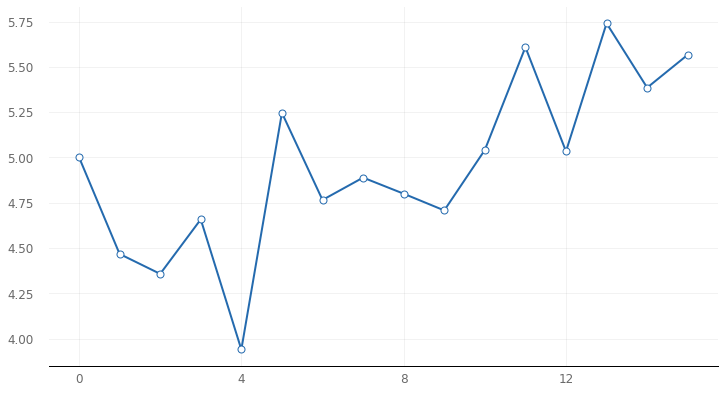

In [ ]:
analyze_object.plot_line('val_loss')

# Creating a model based on the best parameters got after Hypertuning

In [ ]:
i = Input(shape=(maxlen,))
x = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)(i)
x = LSTM(64)(x)
x = Dropout(0.1)(x)
x = Dense(40, activation='relu')(x)
x = Dropout(0.1)(x)
output_1 = Dense(1, activation='sigmoid')(x)
output_2 = Dense(1, activation='sigmoid')(x)
output_3 = Dense(1, activation='sigmoid')(x)
output_4 = Dense(1, activation='sigmoid')(x)
output_5 = Dense(1, activation='sigmoid')(x)

model = Model(inputs = i, outputs = [output_1,output_2,output_3,output_4,output_5])
opt = Adam()
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [ ]:
r = model.fit(
    x= X_train,
    y=[y1_train,y2_train,y3_train,y4_train,y5_train],
    epochs =500,
    batch_size=128,
    validation_split = 0.2
)

Epoch 1/500
13/13 [==============================] - 4s 75ms/step - loss: 3.1553 - dense_7_loss: 0.5199 - dense_8_loss: 0.6728 - dense_9_loss: 0.7131 - dense_10_loss: 0.6832 - dense_11_loss: 0.5663 - dense_7_accuracy: 0.8646 - dense_8_accuracy: 0.6129 - dense_9_accuracy: 0.4068 - dense_10_accuracy: 0.5076 - dense_11_accuracy: 0.8201 - val_loss: 2.6617 - val_dense_7_loss: 0.4397 - val_dense_8_loss: 0.6245 - val_dense_9_loss: 0.6734 - val_dense_10_loss: 0.5250 - val_dense_11_loss: 0.3991 - val_dense_7_accuracy: 0.8469 - val_dense_8_accuracy: 0.7111 - val_dense_9_accuracy: 0.5556 - val_dense_10_accuracy: 0.8272 - val_dense_11_accuracy: 0.8815
Epoch 2/500
13/13 [==============================] - 0s 22ms/step - loss: 2.6514 - dense_7_loss: 0.4237 - dense_8_loss: 0.6307 - dense_9_loss: 0.6604 - dense_10_loss: 0.5395 - dense_11_loss: 0.3971 - dense_7_accuracy: 0.8696 - dense_8_accuracy: 0.7039 - dense_9_accuracy: 0.6101 - dense_10_accuracy: 0.8110 - dense_11_accuracy: 0.8802 - val_loss: 2.499

It took 3 mins to fit the model with the best parameter from Hypertuning the model.

In [ ]:
model_path = '/content/drive/MyDrive/capstone_weltone_finalHypertunedmodel.h5'
model.save(model_path)

# Loading the Model

In [ ]:
model_path = '/content/drive/MyDrive/capstone_weltone_finalHypertunedmodel.h5'
model = tf.keras.models.load_model(model_path)

# Predicting test data

In [ ]:
y_pred = model.predict(X_test)

# Converting probability into either 0 or 1 based in threshold

In [ ]:
thresh = 0.5

y1_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[0]])
y2_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[1]])
y3_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[2]])
y4_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[3]])
y5_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[4]])

# Performance metrics for non-urgent

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y1_test, y1_pred))

              precision    recall  f1-score   support

           0       0.28      0.25      0.26       167
           1       0.90      0.91      0.90      1183

    accuracy                           0.83      1350
   macro avg       0.59      0.58      0.58      1350
weighted avg       0.82      0.83      0.82      1350



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y1_test, y1_pred)
conf_mx

array([[  41,  126],
       [ 105, 1078]])

# Performance metrics for scheduling

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y2_test, y2_pred))

              precision    recall  f1-score   support

           0       0.87      0.86      0.87       909
           1       0.72      0.73      0.72       441

    accuracy                           0.82      1350
   macro avg       0.79      0.80      0.80      1350
weighted avg       0.82      0.82      0.82      1350



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y2_test, y2_pred)
conf_mx

array([[785, 124],
       [120, 321]])

# Performance metrics for Physical

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y3_test, y3_pred))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92       980
           1       0.78      0.81      0.79       370

    accuracy                           0.88      1350
   macro avg       0.85      0.86      0.86      1350
weighted avg       0.89      0.88      0.89      1350



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y3_test, y3_pred)
conf_mx

array([[893,  87],
       [ 69, 301]])

# Performance metrics for Medications

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y4_test, y4_pred))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      1106
           1       0.83      0.62      0.71       244

    accuracy                           0.91      1350
   macro avg       0.87      0.80      0.83      1350
weighted avg       0.90      0.91      0.90      1350



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y4_test, y4_pred)
conf_mx

array([[1074,   32],
       [  92,  152]])

# Performance metrics for Technical

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y5_test, y5_pred))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1201
           1       0.73      0.66      0.70       149

    accuracy                           0.94      1350
   macro avg       0.85      0.82      0.83      1350
weighted avg       0.93      0.94      0.93      1350



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y5_test, y5_pred)
conf_mx

array([[1165,   36],
       [  50,   99]])

# **Validation Test**

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Flatten, LSTM, GlobalMaxPooling1D, Embedding, Input, Dense, Activation, Dropout
from tensorflow.keras.models import Sequential, Model
from sklearn.model_selection import train_test_split
from keras.optimizers import SGD,Adam, RMSprop,Nadam
import tensorflow as tf
import pandas as pd
import numpy as np
import re
from tensorflow import keras

import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
messages = pd.read_csv('/content/drive/MyDrive/D4850 Capstone Project/train_data_200820.csv')

In [ ]:
messages.head()

,ID,Text,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,health_education,physical_need,emotional_need,social_need,health_info_need
0,0,(P): Thank you for checking in || (P): So far ...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,(P): still waiting for the clinic to contact r...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,(C): This is the clinic checking in. How are t...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1
3,3,(C): This is the clinic checking in. How are t...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,(C): This is the clinic checking in. How are t...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
messages.shape

(901, 31)

In [ ]:
#Checking null or empty strings
filter = messages["Text"]!= ""
messages = messages[filter]

In [ ]:
messages.shape

(901, 31)

In [ ]:
# dropping them if there is any
messages = messages.dropna()

In [ ]:
messages.shape

(901, 31)

In [ ]:
messages["Text"][172]

"(C): This is the clinic checking in. How are things this week? || (P): Great || (P): Hello I noticed a discharge from my eyes this morning. I noticed it yesterday but it's worst today. Especially my left. || (C): Hi  humanname , I will ask the clinic  humanname  to call you. Is that ok? || (P): Yes || (C): Hi  humanname ,  humanname  Clinic  humanname  here. I tried calling on both your cell and home phone , but no answer. Can you please call me here at the clinic at 559-4932."

In [ ]:
# lets plot the comments count for each label.
messages.columns

Index(['ID', 'Text', 'physical', 'emotional', 'diagnosis', 'laboratory',
       'imaging', 'medications', 'procedures', 'alternative', 'therapy',
       'counseling', 'diet', 'exercise', 'substance', 'housing', 'work',
       'social_service', 'ff', 'cultural', 'travel', 'environment',
       'financial', 'outpatient', 'hospitalization', 'technical',
       'health_education', 'physical_need', 'emotional_need', 'social_need',
       'health_info_need'],
      dtype='object')

In [ ]:
messages_labels = messages[['physical', 'emotional', 'diagnosis', 'laboratory',
       'imaging', 'medications', 'procedures', 'alternative', 'therapy',
       'counseling', 'diet', 'exercise', 'substance', 'housing', 'work',
       'social_service', 'ff', 'cultural', 'travel', 'environment',
       'financial', 'outpatient', 'hospitalization', 'technical',
       'health_education', 'physical_need', 'emotional_need', 'social_need',
       'health_info_need']]

messages_labels.head()

,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,health_education,physical_need,emotional_need,social_need,health_info_need
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


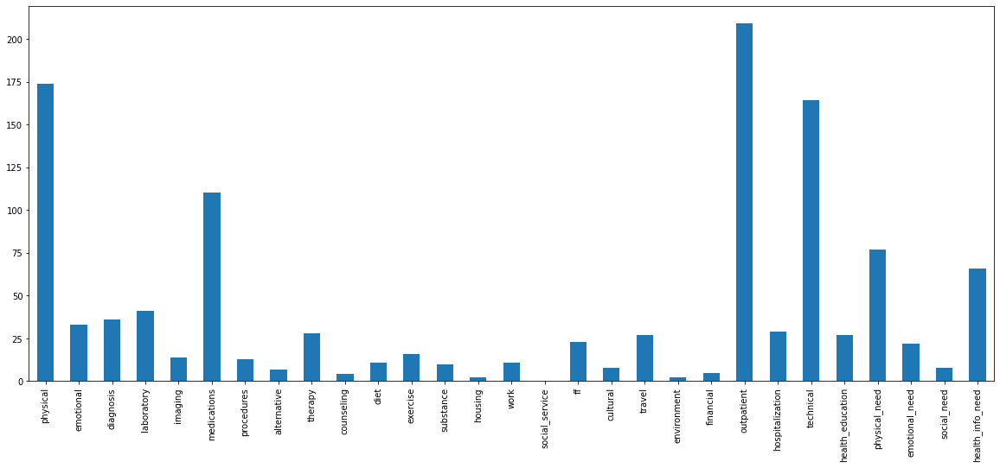

In [ ]:
# count for each labels
f, ax = plt.subplots(figsize=(20,8))
messages_labels.sum().plot.bar()

# Multi-Label Classification Problem with Single Output Layer (Validation)

In [ ]:
# cleaning the text
import nltk
import re
nltk.download('stopwords')      #downloading stopwords
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
def text_stemming(text):
  msg = re.sub('[^a-zA-Z]', ' ', text)
  msg = msg.lower()
  msg = nltk.tokenize.word_tokenize(msg)
  # ps = PorterStemmer()
  # wl = WordNetLemmatizer()
  # print('After tokenization')
  # print(msg)
  # msg = [ps.stem(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [wl.lemmatize(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [ps.stem(word) for word in msg if not word in set(stopwords.words('english'))]
  # msg = [ps.stem(word) for word in msg if not word in my_stopwords]
  # print('After stemming and removing stop words')
  # print(msg)
  msg = [word for word in msg if len(word)>2]
  # print('After keeping only words whose length is greater than 2')
  # print(msg)
  msg = ' '.join(msg)
  return msg

In [ ]:
messages['Processed_text'] =messages.Text.apply(lambda x: text_stemming(x))

In [ ]:
messages.head()

,ID,Text,physical,emotional,diagnosis,laboratory,imaging,medications,procedures,alternative,therapy,counseling,diet,exercise,substance,housing,work,social_service,ff,cultural,travel,environment,financial,outpatient,hospitalization,technical,health_education,physical_need,emotional_need,social_need,health_info_need,Processed_text
0,0,(P): Thank you for checking in || (P): So far ...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,thank you for checking far good can wait for b...
1,1,(P): still waiting for the clinic to contact r...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,still waiting for the clinic contact appointme...
2,2,(C): This is the clinic checking in. How are t...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,this the clinic checking how are things this w...
3,3,(C): This is the clinic checking in. How are t...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,this the clinic checking how are things this w...
4,4,(C): This is the clinic checking in. How are t...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,this the clinic checking how are things this w...


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(messages["Processed_text"], messages_labels, test_size =0.4 , random_state=0)

In [ ]:
# Checking percentage of samples for each labels
label_percent = (messages_labels.mean()*100).sort_values(ascending=False)
label_percent

outpatient          23.196448
physical            19.311876
technical           18.201998
medications         12.208657
physical_need        8.546060
health_info_need     7.325194
laboratory           4.550499
diagnosis            3.995560
emotional            3.662597
hospitalization      3.218646
therapy              3.107658
health_education     2.996670
travel               2.996670
ff                   2.552719
emotional_need       2.441731
exercise             1.775805
imaging              1.553829
procedures           1.442841
diet                 1.220866
work                 1.220866
substance            1.109878
social_need          0.887902
cultural             0.887902
alternative          0.776915
financial            0.554939
counseling           0.443951
housing              0.221976
environment          0.221976
social_service       0.000000
dtype: float64

In [ ]:
# Picking only those samples whichh have count greater than 6% of overall sample
label_percent[label_percent > 10]

outpatient     23.196448
physical       19.311876
technical      18.201998
medications    12.208657
dtype: float64

In [ ]:
# creating training and testing variables
y1_train = y_train[["outpatient"]].values
y1_test =  y_test[["outpatient"]].values

y2_train = y_train[["physical"]].values
y2_test =  y_test[["physical"]].values

y3_train = y_train[["technical"]].values
y3_test =  y_test[["technical"]].values

y4_train = y_train[["medications"]].values
y4_test =  y_test[["medications"]].values


In [ ]:
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train) # getting the index for each word word['cat'] =2, fitting the training data

X_train = tokenizer.texts_to_sequences(X_train) # transforming the text into integer using above dictionary
X_test = tokenizer.texts_to_sequences(X_test)

vocab_size = len(tokenizer.word_index) + 1
maxlen = 200

In [ ]:
X_train = pad_sequences(X_train,maxlen=maxlen)
X_test = pad_sequences(X_test,maxlen=maxlen)

# Glove Word Embedding (Validation)

In [ ]:
from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()

glove_file = open('/content/drive/MyDrive/D4850 Capstone Project/glove.6B.100d.txt')

for line in glove_file:
  records = line.split()
  word = records[0]
  vector_dimensions = asarray(records[1:], dtype='float32')
  embeddings_dictionary[word] = vector_dimensions

glove_file.close()

embedding_matrix = zeros((vocab_size, 100))
for word, index in tokenizer.word_index.items():
  embedding_vector = embeddings_dictionary.get(word)
  if embedding_vector is not None:
    embedding_matrix[index] = embedding_vector

# Building a Model (Validation)

In [ ]:
maxlen

200

In [ ]:
vocab_size

2235

In [ ]:
pip install talos

     |████████████████████████████████| 61kB 7.3MB/s 
     |████████████████████████████████| 9.5MB 23.4MB/s 
     |████████████████████████████████| 5.4MB 53.2MB/s 
     |████████████████████████████████| 2.6MB 50.0MB/s 
  Created wheel for kerasplotlib: filename=kerasplotlib-0.1.6-cp37-none-any.whl size=3603 sha256=3650ef6601d894a18c938c60d76b43311768008399c9365296cf9ca2a741c7e5
  Stored in directory: /root/.cache/pip/wheels/9d/d3/8c/9503a22b0a38e8b21c70ad834e4606d209193443e5c709305d
  Created wheel for wrangle: filename=wrangle-0.6.7-cp37-none-any.whl size=49894 sha256=7f96fe2c2dd8808ec0e199183beb5288ab6e2e6cee352e7fdc5709b4d076583c
  Stored in directory: /root/.cache/pip/wheels/bf/1b/50/d0403ce6ef269e364894da7b50db68db14c4ac62c577561e2d
  Created wheel for chances: filename=chances-0.1.9-cp37-none-any.whl size=41610 sha256=2fd58388c9bc02de3661d267aa35891dc46acc82d4bc4fabf54e26dbbb582ea7
  Stored in directory: /root/.cache/pip/wheels/75/33/46/c871b94249bd57d17797d049b3dff8e3a09c315a

In [ ]:
import talos

In [ ]:
#Adding Input Parameters to the Function.
def topics_classifier(x_train,y_train,x_val, y_val,params):
  
  #inp=Input(shape=(maxpadlen, ),dtype='int32')
  #print(maxlen)
  inp = Input(shape=(200,))

  embedding_layer =  Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)
  embedded_sequences = embedding_layer(inp)

  x = LSTM(params['output_count_lstm'],name='lstm_layer')(embedded_sequences)
  
  x = Dropout(params['dropout'])(x)
  
  x = Dense(params['output_count_dense'], activation=params['activation'])(x)
  
  x = Dropout(params['dropout'])(x)
  
  output_1 = Dense(1, activation=params['last_activation'])(x)
  output_2 = Dense(1, activation=params['last_activation'])(x)
  output_3 = Dense(1, activation=params['last_activation'])(x)
  output_4 = Dense(1, activation=params['last_activation'])(x)

  model = Model(inputs=inp, outputs=[output_1,output_2,output_3,output_4])

  model.compile(loss=params['loss'], optimizer=params['optimizer'], metrics=['accuracy'])

  model_info=model.fit(x= x_train,y= y_train,
                       epochs=params['epochs'], batch_size=params['batch_size'],  validation_data=(x_val, y_val))

  return model_info, model

In [ ]:
#A dictionary of Parameters.
p={
    'output_count_lstm': [64, 128],
    'output_count_dense': [40, 50],
    'batch_size': [128],
    'epochs':[500],
    'optimizer':['Nadam','adam'],
    'activation':['relu'],
    'last_activation': ['sigmoid'],
    'dropout':[0.1,0.2],
    'loss': ['binary_crossentropy']   
}

#GridSearchCV
scan_results = talos.Scan(x=X_train,
           y = [y1_train, y2_train, y3_train,y4_train],
           x_val = X_test,
           y_val = [y1_test, y2_test, y3_test,y4_test],
           params=p,
           model=topics_classifier,
           experiment_name='topic_cls',
           print_params=True)

  0%|          | 0/16 [00:00<?, ?it/s]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 35s 205ms/step - loss: 2.5634 - dense_1_loss: 0.7249 - dense_2_loss: 0.7206 - dense_3_loss: 0.5995 - dense_4_loss: 0.5184 - dense_1_accuracy: 0.3998 - dense_2_accuracy: 0.4042 - dense_3_accuracy: 0.7766 - dense_4_accuracy: 0.8810 - val_loss: 2.1787 - val_dense_1_loss: 0.6583 - val_dense_2_loss: 0.5977 - val_dense_3_loss: 0.5284 - val_dense_4_loss: 0.3944 - val_dense_1_accuracy: 0.7535 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 42ms/step - loss: 2.1180 - dense_1_loss: 0.6476 - dense_2_loss: 0.5705 - dense_3_loss: 0.5111 - dense_4_loss: 0.3888 - dense_1_accuracy: 0.7046 - dense_2_accuracy: 0.8107 - dense_3_accuracy: 0.8240 - dense_4

  6%|▋         | 1/16 [02:28<37:11, 148.79s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 197ms/step - loss: 2.6210 - dense_1_loss: 0.6159 - dense_2_loss: 0.6706 - dense_3_loss: 0.7730 - dense_4_loss: 0.5615 - dense_1_accuracy: 0.7310 - dense_2_accuracy: 0.5565 - dense_3_accuracy: 0.2953 - dense_4_accuracy: 0.8549 - val_loss: 2.0887 - val_dense_1_loss: 0.5406 - val_dense_2_loss: 0.5442 - val_dense_3_loss: 0.5926 - val_dense_4_loss: 0.4114 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 57ms/step - loss: 2.0405 - dense_1_loss: 0.5509 - dense_2_loss: 0.5301 - dense_3_loss: 0.5534 - dense_4_loss: 0.4060 - dense_1_accuracy: 0.7600 - dense_2_accuracy: 0.7987 - dense_3_accuracy: 0.8398 - dense_4

 12%|█▎        | 2/16 [04:27<32:34, 139.62s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 3s 187ms/step - loss: 2.8318 - dense_1_loss: 0.6775 - dense_2_loss: 0.6612 - dense_3_loss: 0.8090 - dense_4_loss: 0.6841 - dense_1_accuracy: 0.6132 - dense_2_accuracy: 0.7224 - dense_3_accuracy: 0.2198 - dense_4_accuracy: 0.5571 - val_loss: 2.5405 - val_dense_1_loss: 0.6658 - val_dense_2_loss: 0.6047 - val_dense_3_loss: 0.6621 - val_dense_4_loss: 0.6080 - val_dense_1_accuracy: 0.7230 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.7673 - val_dense_4_accuracy: 0.8809
Epoch 2/500
5/5 [==============================] - 0s 46ms/step - loss: 2.4956 - dense_1_loss: 0.6538 - dense_2_loss: 0.5914 - dense_3_loss: 0.6557 - dense_4_loss: 0.5947 - dense_1_accuracy: 0.6785 - dense_2_accuracy: 0.8017 - dense_3_accuracy: 0.7074 - dense_4_

 19%|█▉        | 3/16 [06:24<28:48, 132.99s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 199ms/step - loss: 2.4632 - dense_1_loss: 0.6566 - dense_2_loss: 0.6170 - dense_3_loss: 0.6206 - dense_4_loss: 0.5690 - dense_1_accuracy: 0.6371 - dense_2_accuracy: 0.7482 - dense_3_accuracy: 0.6543 - dense_4_accuracy: 0.7841 - val_loss: 1.8958 - val_dense_1_loss: 0.5280 - val_dense_2_loss: 0.5011 - val_dense_3_loss: 0.4869 - val_dense_4_loss: 0.3798 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 44ms/step - loss: 1.8167 - dense_1_loss: 0.5250 - dense_2_loss: 0.4656 - dense_3_loss: 0.4604 - dense_4_loss: 0.3657 - dense_1_accuracy: 0.7722 - dense_2_accuracy: 0.8209 - dense_3_accuracy: 0.8307 - dense_4

 25%|██▌       | 4/16 [08:26<25:55, 129.66s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 3s 190ms/step - loss: 2.5680 - dense_1_loss: 0.6125 - dense_2_loss: 0.6475 - dense_3_loss: 0.6425 - dense_4_loss: 0.6655 - dense_1_accuracy: 0.7417 - dense_2_accuracy: 0.7024 - dense_3_accuracy: 0.6238 - dense_4_accuracy: 0.5736 - val_loss: 2.0208 - val_dense_1_loss: 0.5295 - val_dense_2_loss: 0.5532 - val_dense_3_loss: 0.5036 - val_dense_4_loss: 0.4346 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 47ms/step - loss: 1.9619 - dense_1_loss: 0.5463 - dense_2_loss: 0.5234 - dense_3_loss: 0.4756 - dense_4_loss: 0.4167 - dense_1_accuracy: 0.7600 - dense_2_accuracy: 0.8185 - dense_3_accuracy: 0.8303 - dense_4_a

 31%|███▏      | 5/16 [10:22<23:00, 125.50s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 3s 198ms/step - loss: 2.5208 - dense_1_loss: 0.6612 - dense_2_loss: 0.7061 - dense_3_loss: 0.6062 - dense_4_loss: 0.5472 - dense_1_accuracy: 0.5728 - dense_2_accuracy: 0.4650 - dense_3_accuracy: 0.7629 - dense_4_accuracy: 0.8146 - val_loss: 1.8646 - val_dense_1_loss: 0.5237 - val_dense_2_loss: 0.5055 - val_dense_3_loss: 0.4782 - val_dense_4_loss: 0.3571 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 57ms/step - loss: 1.8276 - dense_1_loss: 0.5375 - dense_2_loss: 0.4901 - dense_3_loss: 0.4435 - dense_4_loss: 0.3566 - dense_1_accuracy: 0.7765 - dense_2_accuracy: 0.8143 - dense_3_accuracy: 0.8323 - dense_4_

 38%|███▊      | 6/16 [12:22<20:39, 123.90s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 3s 191ms/step - loss: 2.5537 - dense_1_loss: 0.7744 - dense_2_loss: 0.6010 - dense_3_loss: 0.5690 - dense_4_loss: 0.6093 - dense_1_accuracy: 0.2592 - dense_2_accuracy: 0.7962 - dense_3_accuracy: 0.8155 - dense_4_accuracy: 0.8183 - val_loss: 2.1654 - val_dense_1_loss: 0.6805 - val_dense_2_loss: 0.5116 - val_dense_3_loss: 0.5004 - val_dense_4_loss: 0.4730 - val_dense_1_accuracy: 0.7091 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 51ms/step - loss: 2.0908 - dense_1_loss: 0.6506 - dense_2_loss: 0.4983 - dense_3_loss: 0.4718 - dense_4_loss: 0.4701 - dense_1_accuracy: 0.6875 - dense_2_accuracy: 0.8094 - dense_3_accuracy: 0.8203 - dense_4_a

 44%|████▍     | 7/16 [14:18<18:13, 121.49s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.1, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 3s 198ms/step - loss: 2.4297 - dense_1_loss: 0.6546 - dense_2_loss: 0.6421 - dense_3_loss: 0.5479 - dense_4_loss: 0.5851 - dense_1_accuracy: 0.5864 - dense_2_accuracy: 0.7168 - dense_3_accuracy: 0.8111 - dense_4_accuracy: 0.8291 - val_loss: 1.9093 - val_dense_1_loss: 0.5148 - val_dense_2_loss: 0.5262 - val_dense_3_loss: 0.4806 - val_dense_4_loss: 0.3876 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 58ms/step - loss: 1.9034 - dense_1_loss: 0.5532 - dense_2_loss: 0.5239 - dense_3_loss: 0.4538 - dense_4_loss: 0.3725 - dense_1_accuracy: 0.7638 - dense_2_accuracy: 0.7996 - dense_3_accuracy: 0.8312 - dense_4_

 50%|█████     | 8/16 [16:24<16:22, 122.80s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 4s 194ms/step - loss: 2.6380 - dense_1_loss: 0.7192 - dense_2_loss: 0.6258 - dense_3_loss: 0.6491 - dense_4_loss: 0.6439 - dense_1_accuracy: 0.4150 - dense_2_accuracy: 0.7876 - dense_3_accuracy: 0.6448 - dense_4_accuracy: 0.7057 - val_loss: 2.2357 - val_dense_1_loss: 0.6164 - val_dense_2_loss: 0.5979 - val_dense_3_loss: 0.5175 - val_dense_4_loss: 0.5040 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 45ms/step - loss: 2.1675 - dense_1_loss: 0.6077 - dense_2_loss: 0.5797 - dense_3_loss: 0.4946 - dense_4_loss: 0.4854 - dense_1_accuracy: 0.7425 - dense_2_accuracy: 0.8001 - dense_3_accuracy: 0.8261 - dense_4_

 56%|█████▋    | 9/16 [18:29<14:23, 123.43s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 203ms/step - loss: 2.6864 - dense_1_loss: 0.6423 - dense_2_loss: 0.6825 - dense_3_loss: 0.6860 - dense_4_loss: 0.6756 - dense_1_accuracy: 0.6581 - dense_2_accuracy: 0.5412 - dense_3_accuracy: 0.5257 - dense_4_accuracy: 0.5320 - val_loss: 2.0446 - val_dense_1_loss: 0.5335 - val_dense_2_loss: 0.5221 - val_dense_3_loss: 0.5383 - val_dense_4_loss: 0.4508 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 59ms/step - loss: 2.0166 - dense_1_loss: 0.5458 - dense_2_loss: 0.4961 - dense_3_loss: 0.5355 - dense_4_loss: 0.4393 - dense_1_accuracy: 0.7696 - dense_2_accuracy: 0.8087 - dense_3_accuracy: 0.8092 - dense_4

 62%|██████▎   | 10/16 [20:47<12:48, 128.02s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 4s 205ms/step - loss: 2.7422 - dense_1_loss: 0.6949 - dense_2_loss: 0.6681 - dense_3_loss: 0.6858 - dense_4_loss: 0.6934 - dense_1_accuracy: 0.5150 - dense_2_accuracy: 0.5919 - dense_3_accuracy: 0.5179 - dense_4_accuracy: 0.5316 - val_loss: 2.2452 - val_dense_1_loss: 0.6032 - val_dense_2_loss: 0.5362 - val_dense_3_loss: 0.5539 - val_dense_4_loss: 0.5520 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 45ms/step - loss: 2.2146 - dense_1_loss: 0.6064 - dense_2_loss: 0.5309 - dense_3_loss: 0.5354 - dense_4_loss: 0.5419 - dense_1_accuracy: 0.7381 - dense_2_accuracy: 0.7991 - dense_3_accuracy: 0.7951 - dense_4_

 69%|██████▉   | 11/16 [22:58<10:44, 128.95s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'Nadam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 200ms/step - loss: 2.6733 - dense_1_loss: 0.6738 - dense_2_loss: 0.6484 - dense_3_loss: 0.6649 - dense_4_loss: 0.6862 - dense_1_accuracy: 0.5444 - dense_2_accuracy: 0.6341 - dense_3_accuracy: 0.6033 - dense_4_accuracy: 0.5066 - val_loss: 1.9885 - val_dense_1_loss: 0.5286 - val_dense_2_loss: 0.5334 - val_dense_3_loss: 0.5084 - val_dense_4_loss: 0.4180 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 55ms/step - loss: 1.9472 - dense_1_loss: 0.5347 - dense_2_loss: 0.5143 - dense_3_loss: 0.4984 - dense_4_loss: 0.3998 - dense_1_accuracy: 0.7711 - dense_2_accuracy: 0.8033 - dense_3_accuracy: 0.8123 - dense_4

 75%|███████▌  | 12/16 [25:22<08:52, 133.23s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 4s 236ms/step - loss: 2.6258 - dense_1_loss: 0.6872 - dense_2_loss: 0.6968 - dense_3_loss: 0.6419 - dense_4_loss: 0.5998 - dense_1_accuracy: 0.5192 - dense_2_accuracy: 0.5063 - dense_3_accuracy: 0.6601 - dense_4_accuracy: 0.7849 - val_loss: 2.1120 - val_dense_1_loss: 0.5474 - val_dense_2_loss: 0.5647 - val_dense_3_loss: 0.5151 - val_dense_4_loss: 0.4849 - val_dense_1_accuracy: 0.7701 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 57ms/step - loss: 2.0629 - dense_1_loss: 0.5622 - dense_2_loss: 0.5443 - dense_3_loss: 0.4904 - dense_4_loss: 0.4661 - dense_1_accuracy: 0.7583 - dense_2_accuracy: 0.7964 - dense_3_accuracy: 0.8292 - dense_4_a

 81%|████████▏ | 13/16 [27:32<06:37, 132.42s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 40, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 218ms/step - loss: 2.8183 - dense_1_loss: 0.8073 - dense_2_loss: 0.7101 - dense_3_loss: 0.6520 - dense_4_loss: 0.6489 - dense_1_accuracy: 0.3320 - dense_2_accuracy: 0.4993 - dense_3_accuracy: 0.6644 - dense_4_accuracy: 0.6156 - val_loss: 2.1293 - val_dense_1_loss: 0.6081 - val_dense_2_loss: 0.5513 - val_dense_3_loss: 0.5496 - val_dense_4_loss: 0.4203 - val_dense_1_accuracy: 0.7590 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 60ms/step - loss: 2.0868 - dense_1_loss: 0.6130 - dense_2_loss: 0.5376 - dense_3_loss: 0.5309 - dense_4_loss: 0.4053 - dense_1_accuracy: 0.6807 - dense_2_accuracy: 0.8042 - dense_3_accuracy: 0.8026 - dense_4_

 88%|████████▊ | 14/16 [29:58<04:33, 136.50s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 64}
Epoch 1/500
5/5 [==============================] - 4s 300ms/step - loss: 2.6369 - dense_1_loss: 0.7394 - dense_2_loss: 0.6838 - dense_3_loss: 0.6997 - dense_4_loss: 0.5141 - dense_1_accuracy: 0.3856 - dense_2_accuracy: 0.5112 - dense_3_accuracy: 0.4635 - dense_4_accuracy: 0.8599 - val_loss: 2.1244 - val_dense_1_loss: 0.6329 - val_dense_2_loss: 0.5319 - val_dense_3_loss: 0.5588 - val_dense_4_loss: 0.4008 - val_dense_1_accuracy: 0.7839 - val_dense_2_accuracy: 0.7839 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 60ms/step - loss: 2.0390 - dense_1_loss: 0.6249 - dense_2_loss: 0.5099 - dense_3_loss: 0.5244 - dense_4_loss: 0.3799 - dense_1_accuracy: 0.7174 - dense_2_accuracy: 0.8187 - dense_3_accuracy: 0.8304 - dense_4_a

 94%|█████████▍| 15/16 [32:26<02:20, 140.04s/it]

{'activation': 'relu', 'batch_size': 128, 'dropout': 0.2, 'epochs': 500, 'last_activation': 'sigmoid', 'loss': 'binary_crossentropy', 'optimizer': 'adam', 'output_count_dense': 50, 'output_count_lstm': 128}
Epoch 1/500
5/5 [==============================] - 4s 277ms/step - loss: 2.4622 - dense_1_loss: 0.6060 - dense_2_loss: 0.6441 - dense_3_loss: 0.6114 - dense_4_loss: 0.6008 - dense_1_accuracy: 0.7506 - dense_2_accuracy: 0.6858 - dense_3_accuracy: 0.7688 - dense_4_accuracy: 0.7119 - val_loss: 1.9131 - val_dense_1_loss: 0.5253 - val_dense_2_loss: 0.5222 - val_dense_3_loss: 0.4867 - val_dense_4_loss: 0.3788 - val_dense_1_accuracy: 0.7729 - val_dense_2_accuracy: 0.7978 - val_dense_3_accuracy: 0.8061 - val_dense_4_accuracy: 0.8753
Epoch 2/500
5/5 [==============================] - 0s 68ms/step - loss: 1.9049 - dense_1_loss: 0.5528 - dense_2_loss: 0.5214 - dense_3_loss: 0.4627 - dense_4_loss: 0.3680 - dense_1_accuracy: 0.7500 - dense_2_accuracy: 0.7907 - dense_3_accuracy: 0.8276 - dense_4_

100%|██████████| 16/16 [35:03<00:00, 131.46s/it]


**It** took 30m 27s to run above code of Hypertuning

In [ ]:
#Analyzing the result
analyze_object = talos.Analyze(scan_results)


In [ ]:
param_details = pd.DataFrame(analyze_object.data)
#param_details.columns
param_details.sort_values(by=['val_loss']).head(5)

,start,end,duration,round_epochs,loss,dense_1_loss,dense_2_loss,dense_3_loss,dense_4_loss,dense_1_accuracy,dense_2_accuracy,dense_3_accuracy,dense_4_accuracy,val_loss,val_dense_1_loss,val_dense_2_loss,val_dense_3_loss,val_dense_4_loss,val_dense_1_accuracy,val_dense_2_accuracy,val_dense_3_accuracy,val_dense_4_accuracy,activation,batch_size,dropout,epochs,last_activation,loss,optimizer,output_count_dense,output_count_lstm
3,04/11/21-054426,04/11/21-054627,121.619836,500,0.276197,0.121916,0.027139,0.103999,0.023142,0.935185,0.988889,0.951852,0.992593,2.323761,0.749205,0.462177,0.829806,0.282573,0.803324,0.905817,0.831025,0.950139,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,50,128
6,04/11/21-055024,04/11/21-055219,115.619554,500,0.208622,0.113222,0.017851,0.074959,0.002590,0.927778,0.988889,0.959259,1.000000,2.451328,0.788222,0.486092,0.850112,0.326902,0.800554,0.919668,0.833795,0.947368,relu,128,0.1,500,sigmoid,binary_crossentropy,adam,50,64
2,04/11/21-054228,04/11/21-054425,117.232586,500,0.206348,0.109930,0.013336,0.076801,0.006281,0.935185,0.994444,0.955556,0.998148,2.581833,0.787784,0.428129,0.898638,0.467283,0.797784,0.914127,0.814404,0.922438,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,50,64
0,04/11/21-053801,04/11/21-054030,148.615418,500,0.206798,0.105482,0.013232,0.081334,0.006750,0.937037,0.992593,0.948148,0.998148,2.633495,0.724798,0.575594,0.927940,0.405163,0.814404,0.914127,0.817174,0.927978,relu,128,0.1,500,sigmoid,binary_crossentropy,Nadam,40,64
4,04/11/21-054628,04/11/21-054823,115.529226,500,0.203456,0.098441,0.017345,0.080809,0.006861,0.948148,0.992593,0.950000,0.998148,2.674570,0.807188,0.510510,0.841789,0.515083,0.817174,0.922438,0.808864,0.925208,relu,128,0.1,500,sigmoid,binary_crossentropy,adam,40,64


In [ ]:
pd.DataFrame(analyze_object.data).to_csv("/content/drive/MyDrive/D4850 Capstone Project/model_param_saved.csv")

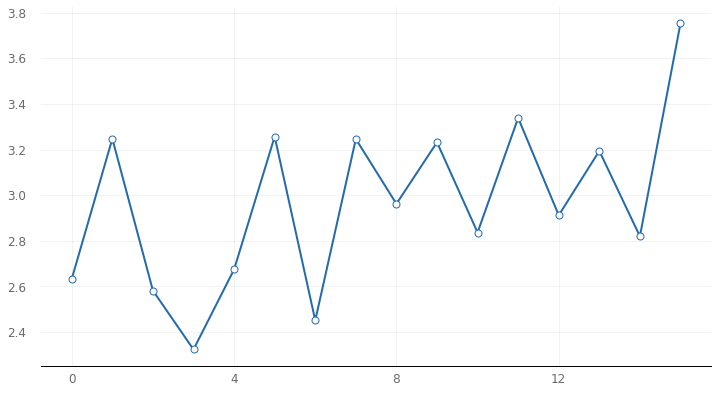

In [ ]:
analyze_object.plot_line('val_loss')

# Creating a model based on the best parameters got after Hypertuning (Validation)

In [ ]:
i = Input(shape=(maxlen,))
x = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)(i)
x = LSTM(64)(x)
x = Dropout(0.1)(x)
x = Dense(40, activation='relu')(x)
x = Dropout(0.1)(x)
output_1 = Dense(1, activation='sigmoid')(x)
output_2 = Dense(1, activation='sigmoid')(x)
output_3 = Dense(1, activation='sigmoid')(x)
output_4 = Dense(1, activation='sigmoid')(x)

model = Model(inputs = i, outputs = [output_1,output_2,output_3,output_4])
opt = Adam()
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [ ]:
r = model.fit(
    x= X_train,
    y=[y1_train,y2_train,y3_train,y4_train],
    epochs =500,
    batch_size=128,
    validation_split = 0.2
)

Epoch 1/500
4/4 [==============================] - 3s 225ms/step - loss: 2.3217 - dense_1_loss: 0.6044 - dense_2_loss: 0.6190 - dense_3_loss: 0.6039 - dense_4_loss: 0.4944 - dense_1_accuracy: 0.7599 - dense_2_accuracy: 0.7674 - dense_3_accuracy: 0.8078 - dense_4_accuracy: 0.8889 - val_loss: 1.9656 - val_dense_1_loss: 0.5192 - val_dense_2_loss: 0.5331 - val_dense_3_loss: 0.5364 - val_dense_4_loss: 0.3771 - val_dense_1_accuracy: 0.8056 - val_dense_2_accuracy: 0.8056 - val_dense_3_accuracy: 0.7870 - val_dense_4_accuracy: 0.8796
Epoch 2/500
4/4 [==============================] - 0s 41ms/step - loss: 1.9356 - dense_1_loss: 0.5509 - dense_2_loss: 0.5232 - dense_3_loss: 0.4767 - dense_4_loss: 0.3848 - dense_1_accuracy: 0.7547 - dense_2_accuracy: 0.8100 - dense_3_accuracy: 0.8341 - dense_4_accuracy: 0.8745 - val_loss: 1.8281 - val_dense_1_loss: 0.4834 - val_dense_2_loss: 0.4902 - val_dense_3_loss: 0.5119 - val_dense_4_loss: 0.3425 - val_dense_1_accuracy: 0.8056 - val_dense_2_accuracy: 0.8056 -

It took 1m 22s to fit the model with the best parameter from Hypertuning the model.

In [ ]:
model_path = '/content/drive/MyDrive/D4850 Capstone Project/capstone_weltone_validationHypertunedmodel.h5'
model.save(model_path)

# Loading the Model (Validation)

In [ ]:
model_path = '/content/drive/MyDrive/D4850 Capstone Project/capstone_weltone_validationHypertunedmodel.h5'
model = tf.keras.models.load_model(model_path)

# Predicting test data (Validation)

In [ ]:
y_pred = model.predict(X_test)

# Converting probability into either 0 or 1 based in threshold (Validation)

In [ ]:
thresh = 0.5

y1_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[0]])
y2_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[1]])
y3_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[2]])
y4_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_pred[3]])

# Performance metrics for Outpatient (Validation)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y1_test, y1_pred))

              precision    recall  f1-score   support

           0       0.89      0.85      0.87       279
           1       0.55      0.63      0.59        82

    accuracy                           0.80       361
   macro avg       0.72      0.74      0.73       361
weighted avg       0.81      0.80      0.80       361



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y1_test, y1_pred)
conf_mx

array([[236,  43],
       [ 30,  52]])

# Performance metrics for Physical (Validation)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y2_test, y2_pred))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94       288
           1       0.79      0.74      0.77        73

    accuracy                           0.91       361
   macro avg       0.86      0.85      0.85       361
weighted avg       0.91      0.91      0.91       361



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y2_test, y2_pred)
conf_mx

array([[274,  14],
       [ 19,  54]])

# Performance metrics for Technical (Validation)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y3_test, y3_pred))

              precision    recall  f1-score   support

           0       0.87      0.92      0.90       291
           1       0.57      0.44      0.50        70

    accuracy                           0.83       361
   macro avg       0.72      0.68      0.70       361
weighted avg       0.82      0.83      0.82       361



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y3_test, y3_pred)
conf_mx

array([[268,  23],
       [ 39,  31]])

# Performance metrics for Medications (Validation)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y4_test, y4_pred))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       316
           1       0.88      0.64      0.74        45

    accuracy                           0.94       361
   macro avg       0.92      0.82      0.86       361
weighted avg       0.94      0.94      0.94       361



In [ ]:
from sklearn.metrics import confusion_matrix
conf_mx = confusion_matrix(y4_test, y4_pred)
conf_mx

array([[312,   4],
       [ 16,  29]])